# Import libraries

In [9]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import folium

from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

import joblib

import time
import os

# Helper functions

In [ ]:
def convert_datetime(df):

    # Convert 'Timestamp' column to datetime format
    df['Timestamp'] = pd.to_datetime(df['Timestamp'], unit='ns')

    return df

In [ ]:
def reduce_sampling_rate(df):
    df.set_index('Timestamp', inplace=True)
    # Set the 'Timestamp' column as the DataFrame's index
    df_resampled = df.resample('S').first()
    # Reset the index to create a standard numerical index
    df_resampled.reset_index(inplace=True)
    return df_resampled

In [1]:
def plot_total_alt_over_time(df, plot_title='Total Tracked Altitude Over Time'):

    # Create the scatter plot using Plotly Express
    fig = px.scatter(df,
                     x=df['Timestamp'],
                     y=df['Alt(m)'])

    # Update the layout with title and axis labels
    fig.update_layout(
            title='Altitude over Time',
            xaxis_title='Timestamp',
            yaxis_title='Altitude (m)',
            coloraxis_colorbar=dict(title='Cluster Label'),
            width=1000,
            height=600
        )

    # Show the Plotly figure
    fig.show()

In [ ]:
def plot_manual_labeling(df):
    # Plot for Altitude over Time, colored by 'on_lift' status
    plt.figure(figsize=(15, 10))

    # Plot points where 'on_lift' is 1 with one color
    plt.scatter(df.loc[df['on_lift'] == 1, 'Timestamp'],
                df.loc[df['on_lift'] == 1, 'Alt(m)'],
                c='red',
                label='On the lift',
                marker='o')

    # Plot points where 'on_lift' is 0 with another color
    plt.scatter(df.loc[df['on_lift'] == 0, 'Timestamp'],
                df.loc[df['on_lift'] == 0, 'Alt(m)'],
                c='blue',
                label='Not on the lift',
                marker='o')

    plt.title('Labeled Data')
    plt.xlabel('Timestamp')
    plt.ylabel('Altitude (m)')
    plt.legend()
    plt.show()

In [ ]:
def map_lift_rides(df):
    # Create a map centered on the mean latitude and longitude
    map_center = [df['Lat'].mean(),
                  df['Long'].mean()]
    mymap = folium.Map(location=map_center, zoom_start=10)

    # Plot data points with on_lift type
    on_lift = df[df['on_lift'] == 1]
    for index, row in on_lift.iterrows():
        folium.CircleMarker(location=[row['Lat'],
                                      row['Long']],
                            radius=5,
                            color='red',
                            fill=True,
                            fill_color='red',
                            tooltip=str(row['Timestamp'])).add_to(mymap)

    # Plot data points with not_on_lift types
    not_on_lift = df[df['on_lift'] != 1]
    for index, row in not_on_lift.iterrows():
        folium.CircleMarker(location=[row['Lat'],
                                      row['Long']],
                            radius=5,
                            color='blue',
                            fill=True,
                            fill_color='blue',
                            tooltip=str(row['Timestamp'])).add_to(mymap)

    # Return the map object
    return mymap


In [ ]:
#Map all tracked movement based on lat and long of GPS data

def map_tracked_movement(df, zoom_start=12):
    # Create a map centered on the mean latitude and longitude
    map_center = [df['Lat'].mean(), df['Long'].mean()]
    movement_on_map = folium.Map(location=map_center, zoom_start=zoom_start)

    # Add CircleMarkers for each data point
    for index, row in df.iterrows():
        folium.CircleMarker(location=[
                            row['Lat'], 
                            row['Long']], 
                            radius=5, 
                            color='blue', 
                            fill=True, 
                            fill_color='blue').add_to(movement_on_map)

    # Display the map
    return movement_on_map

In [ ]:
#Map only lifts rides

def map_lift_rides(df, column='on_lift', zoom_start=15):
    # Create a map centered on the mean latitude and longitude
    map_center = [df['Lat'].mean(), df['Long'].mean()]
    lift_map = folium.Map(location=map_center, zoom_start=zoom_start)

    # Plot data points with on_lift type
    on_lift = df[df[column] == 1]
    for _, row in on_lift.iterrows():
        folium.CircleMarker(location=[row['Lat'],
                                      row['Long']],
                                      radius=5,
                                      color='red',
                                      fill=True,
                                      fill_color='red',
                                      tooltip=str(row['Timestamp'])).add_to(lift_map)

    # Return the map object
    return lift_map

# Import Data

In [ ]:
# Direct path to file - update as needed 
file_path=' ' # update file path as needed 

# Create dataframe from filepath 
df=pd.read_csv(file_path)

In [ ]:
# Verify 
df

# Reduce sample size 

In [ ]:
# Use helper function to convert 'Timestamp' column dytpe 
df=convert_datetime(df)
# Verify 
df.info()

In [ ]:
# Use helper function to resample to seconds  
df_resampled=reduce_sampling_rate(df)
# Verify 
print(f'Shape before resampling: {df.shape}')
print(f'Shape after resampling: {df_resampled.shape}\n')
df_resampled.info()

In [ ]:
# Verify by plotting
plot_total_alt_over_time(df_resampled)

In [ ]:
# If needed: Export resampled data frame to csv
name_of_csv_resampled=' ' # update name 
df_resampled.to_csv(name_of_csv_resampled, index=False)

In [10]:
# Direct path to file - update as needed 
file_path1='/Users/ze/Documents/Coding/Projects/2024/alturos/github/data/raw/df_Natschen_46_resampled.csv'
file_path2='/Users/ze/Documents/Coding/Projects/2024/alturos/github/data/raw/df_Natschen_18_resampled.csv'
file_path3='/Users/ze/Documents/Coding/Projects/2024/alturos/github/data/raw/df_Andermatt_Gutsch_resampled.csv'
file_path4='/Users/ze/Documents/Coding/Projects/2024/alturos/github/data/raw/df_310_resampled.csv'
file_path5='/Users/ze/Documents/Coding/Projects/2024/alturos/github/data/raw/df_290_resampled.csv'
file_path6='/Users/ze/Documents/Coding/Projects/2024/alturos/github/data/raw/df_206_resampled.csv'
file_path7='/Users/ze/Documents/Coding/Projects/2024/alturos/github/data/raw/df_166_resampled.csv'
file_path8='/Users/ze/Documents/Coding/Projects/2024/alturos/github/data/raw/df_135_resampled.csv'
file_path9='/Users/ze/Documents/Coding/Projects/2024/alturos/github/data/raw/df_131_resampled.csv'
file_path10='/Users/ze/Documents/Coding/Projects/2024/alturos/github/data/raw/df_100_resampled.csv'
file_path11='/Users/ze/Documents/Coding/Projects/2024/alturos/github/data/raw/df_95_resampled.csv'
file_path12='/Users/ze/Documents/Coding/Projects/2024/alturos/github/data/raw/df_57_resampled.csv'

# Create dataframe from filepath 
df1=pd.read_csv(file_path1)
df2=pd.read_csv(file_path2)
df3=pd.read_csv(file_path3)
df4=pd.read_csv(file_path4)
df5=pd.read_csv(file_path5)
df6=pd.read_csv(file_path6)
df7=pd.read_csv(file_path7)
df8=pd.read_csv(file_path8)
df9=pd.read_csv(file_path9)
df10=pd.read_csv(file_path10)
df11=pd.read_csv(file_path11)
df12=pd.read_csv(file_path12)

In [11]:
df_lst=[
df1,
df2,
df3,
df4,
df5,
df6,
df7,
df8,
df9,
df10,
df11,
df12,    
]

1


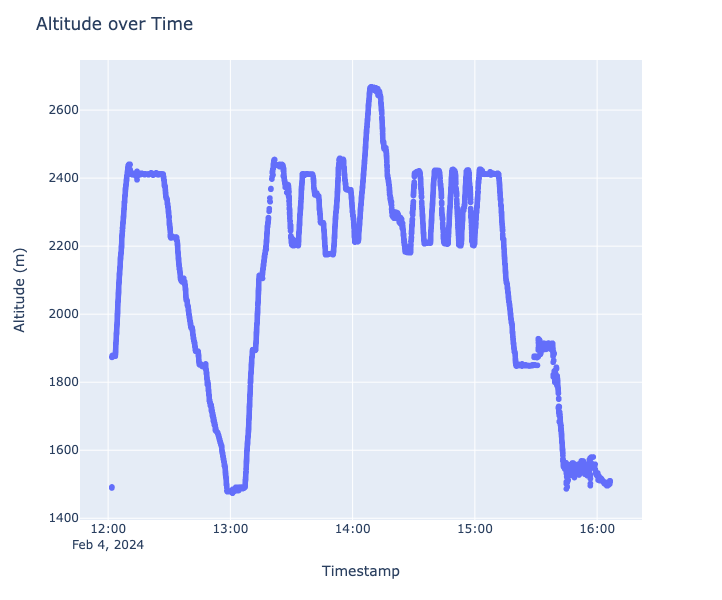

2


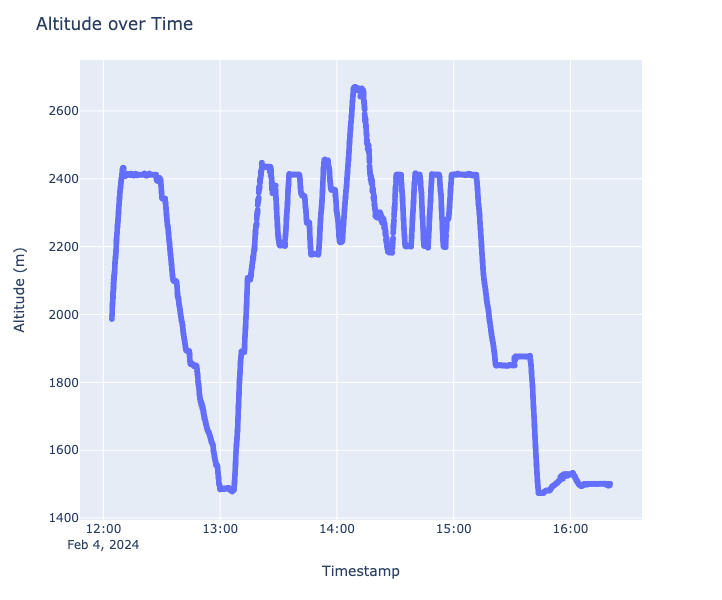

3


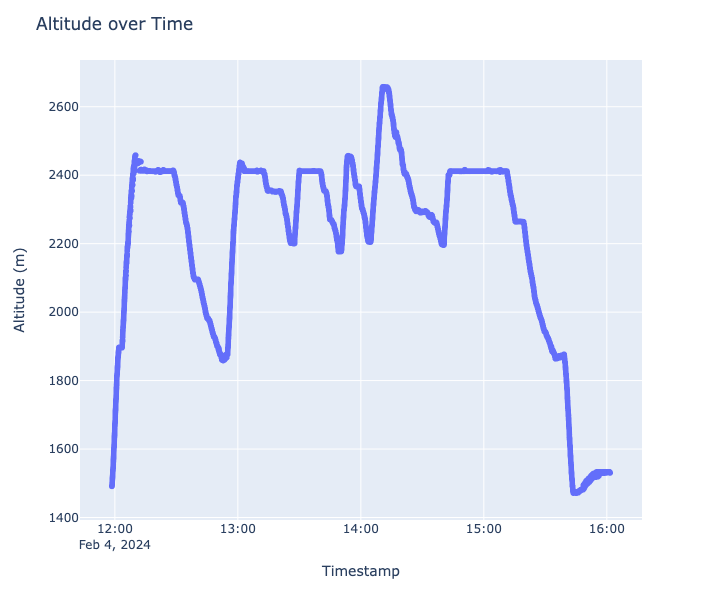

4


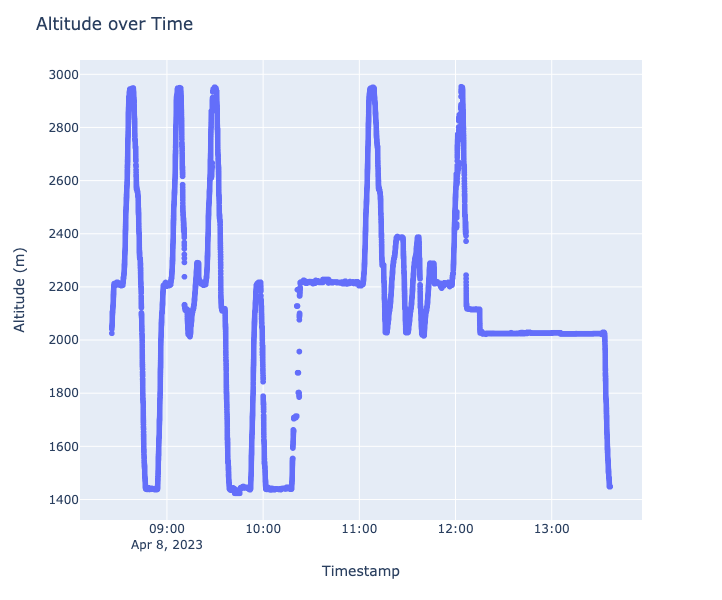

5


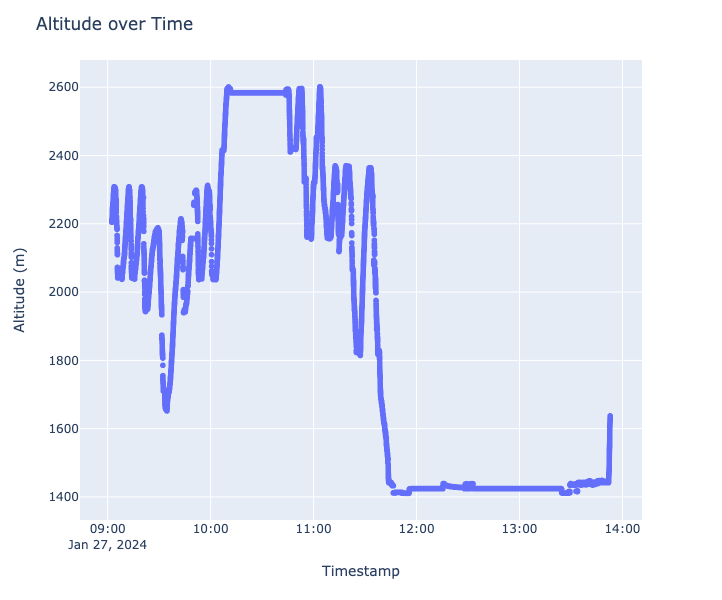

6


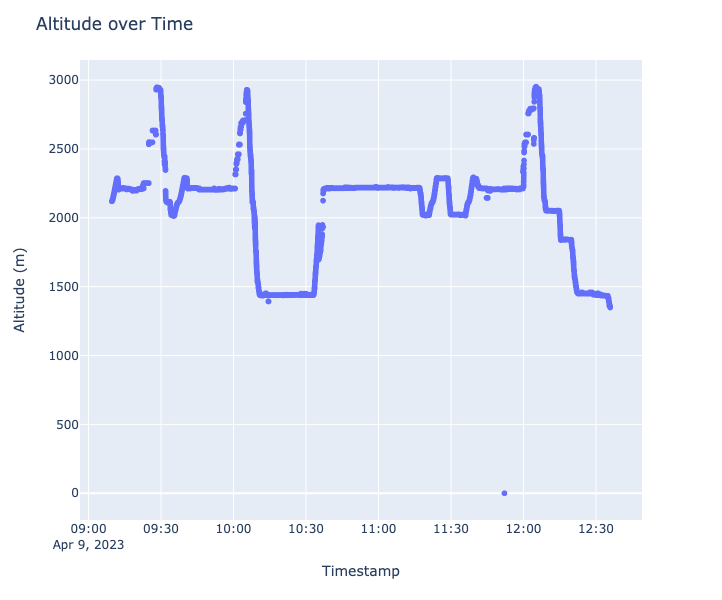

7


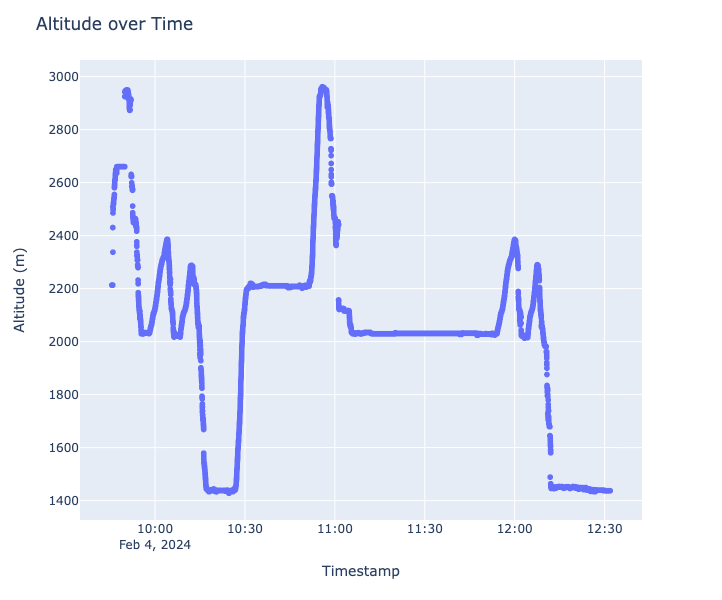

8


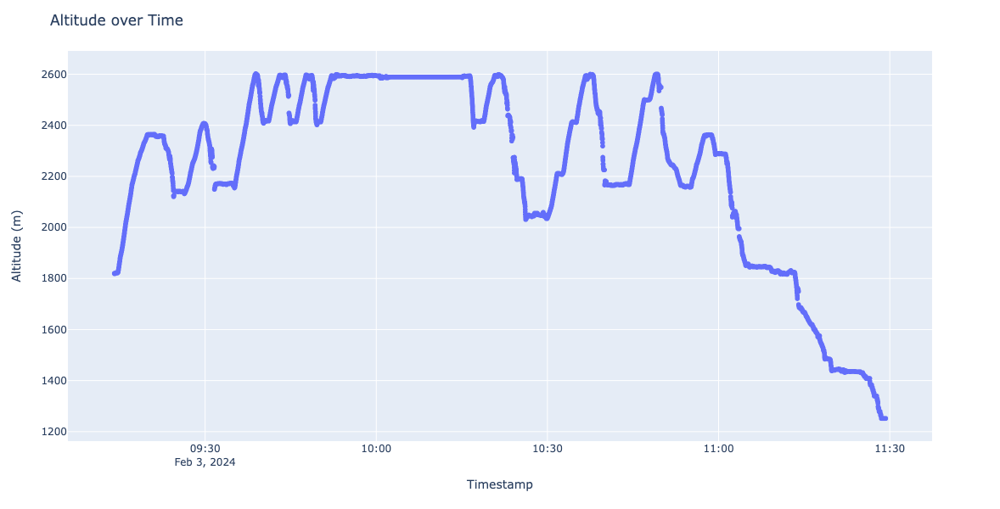

9


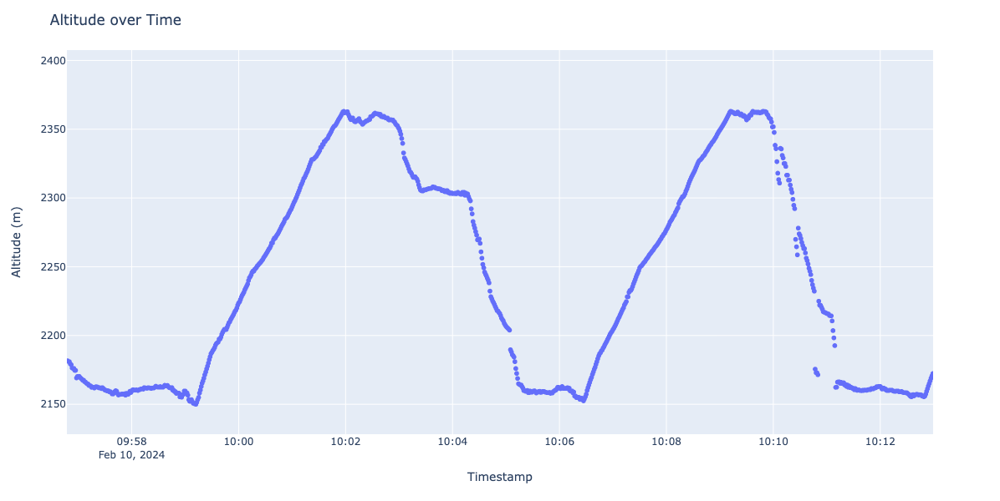

10


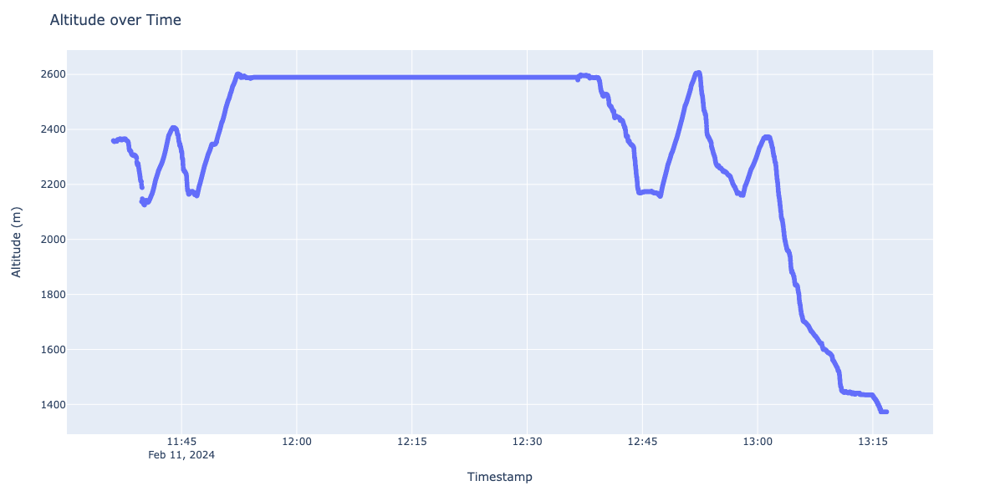

11


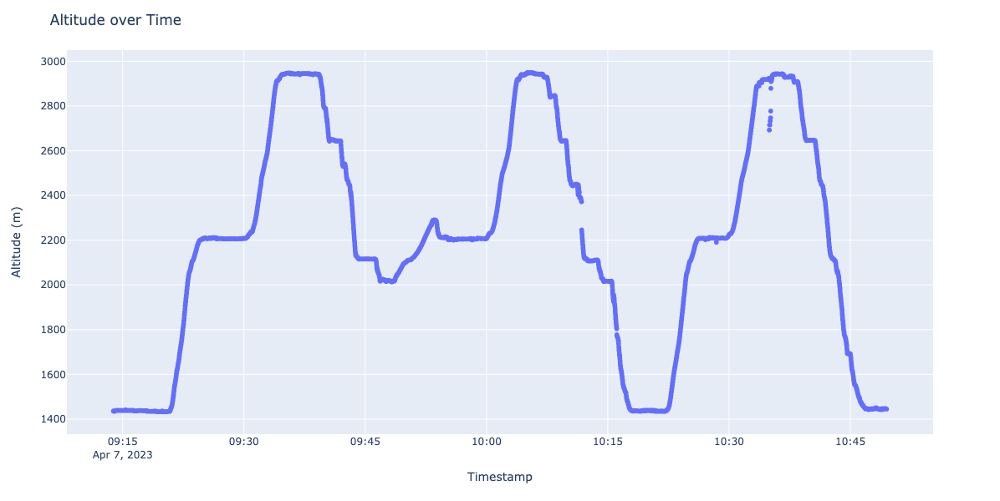

12


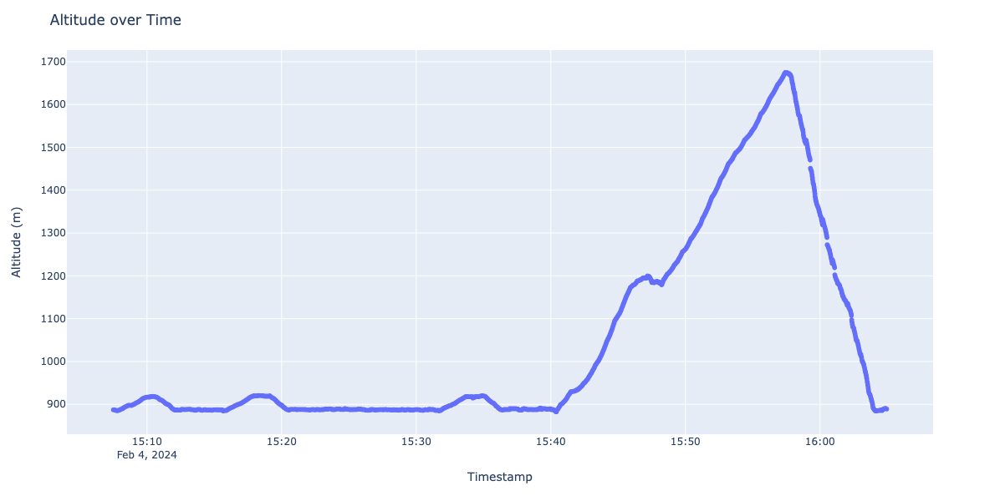

In [12]:
iter=1
for df in df_lst:
    print(iter)
    plot_total_alt_over_time(df)
    iter+=1